In [1]:
import os
import re
import glob
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
from subprocess import run

In [2]:
metadata = pd.read_csv("/gale/netapp/DoD/wenliang/projects/01.HIV/05.clustering/cell2cluster.csv",index_col=0)

In [3]:
allc_tables = ["/gale/netapp/DoD/wenliang/projects/02.MRSA/00.data/allc.table",
              "/gale/netapp/DoD/wenliang/projects/03.BA/00.data/neomorph_allc.table",
              "/gale/netapp/DoD/wenliang/projects/04.OP/00.data/neomorph_allc.table",
               "/gale/netapp/DoD/wenliang/projects/05.COVID/02.clustering/00.data/allc.table",
               "/gale/netapp/DoD/wenliang/projects/06.Flu/02.clustering/00.data/allc.table",
               "/gale/netapp/DoD/wenliang/projects/07.Ctrl/E24E25.allc_table",
               '/gale/netapp/DoD/wenliang/projects/07.Ctrl/Ctrl_2.allc_table',
              "/gale/netapp/scratch/manoj/ECHO/CommonFiles/SAFER/HIV/MCAD/ECHO_HIV_AllCells_AllReps_StrndMrgd_allCFiles_Info.txt"]


In [4]:
allc_table_list = list()
for allc_table in allc_tables:
    allc_df = pd.read_csv(allc_table, sep="\t", names=['cell', 'allc'])
    allc_table_list.append(allc_df)
all_allc_df = pd.concat(allc_table_list)
cell2allc = dict(zip(all_allc_df['cell'], all_allc_df['allc']))

In [5]:
outdir = "/gale/netapp/DoD/wenliang/projects/00.ECHOmerge/02.DMLs/02.methylpyDMR/01.eachExposure/01.HIV/"
methylpy_dir = "/gale/netapp/DoD/wenliang/projects/01.HIV/19.mergeCond/"

In [6]:
cell2annotation = dict()
annotation_files = ['/gale/netapp/DoD/wenliang/projects/01.HIV/05.clustering/cell2cluster.csv']

anno_list = list()
for anno_file in annotation_files:
    anno_df = pd.read_csv(anno_file)
    anno_list.append(anno_df)
    if not 'cell' in anno_df.columns:
        print("cell not in column")
    cell2annotation.update(dict(zip(anno_df['cell'], anno_df['annotation'])))

In [7]:
anno_df = pd.concat(anno_list)

In [8]:
anno_df.shape

(14154, 75)

In [10]:
chroms = ['chr' + str(x) for x in range(1, 23)]
for cell_type, sub_df in anno_df.groupby('annotation'):
    if cell_type in ['B-cell', 'NK-cell', 'Other-cell', 'NA', 'Monocyte1']:
        continue
    cell_dir = f'{outdir}/{cell_type}'
    if not os.path.exists(cell_dir):
        os.mkdir(cell_dir)
    bed_regions = open(f"{cell_dir}/DMLs.bed", 'w')
    dmr_df = pd.read_csv(f'{methylpy_dir}/final_filtered.DMRs.tsv', sep="\t")
    dmr_df = dmr_df[dmr_df['celltype']==cell_type]
        
    dmr_df = dmr_df[dmr_df.columns[:3]]
    dmr_df = dmr_df.drop_duplicates().reset_index(drop=True)
    dmr_df['index'] = [f'{cell_type}_{x}' for x in dmr_df.index]
    dmr_df.to_csv(f"{cell_dir}/DMLs.bed", header=False, index=False, sep="\t")

In [11]:
anno_df['allc'] = [cell2allc[x] for x in anno_df['cell']]
for (cell_type, exposure), sub_df in anno_df.groupby(['annotation', 'condition']):
    if cell_type in ['B-cell', 'NK-cell', 'Other-cell', 'NA', 'Monocyte1']:
        continue
    mcds_dir = f'{outdir}/{cell_type}/MCDS'
    cell_dir = f'{outdir}/{cell_type}'
    if not os.path.exists(mcds_dir):
        os.mkdir(mcds_dir)
    sub_df[['cell', 'allc']].to_csv(f"{mcds_dir}/{exposure}.allc.table", sep="\t", index=False, header=False)
    
    bed_region = f'{cell_dir}/DMLs.bed.gz'
    allc_table = f'{mcds_dir}/{exposure}.allc.table'
    
    mcds_fh = open(f'{mcds_dir}/{cell_type}.{exposure}mcds.sh', 'w')
    print(f'allcools mcds --allc_table {allc_table} --output_prefix {exposure} --region_bed_paths {bed_region} --region_bed_names DML --chrom_size_path /gale/netapp/DoD/wenliang/database/ref/hg38/hg38.sizes --mc_contexts CGN --cpu 10', file=mcds_fh)
    mcds_fh.close()
    

In [12]:
cell_types = ['B-Mem', 'B-Naive', 'Monocyte', 'NK-cell1', 'NK-cell2', 'Tc-Mem', 'Tc-Naive', 'Th-Mem', 'Th-Naive']

In [13]:
from subprocess import check_output

In [24]:
for cell_type in cell_types:
    cell_dir = f'{outdir}/{cell_type}'
    bedfile = f"{cell_dir}/DMLs.bed"
    
    if os.path.exists(bedfile):
        sort_cmd = f'sort -k1,1V -k2,2n -o {bedfile} {bedfile}'
        check_output(sort_cmd, shell=True)
    
    if not os.path.exists(f'{bedfile}.gz'):
        gzip_cmd = f'bgzip {bedfile}'
        check_output(gzip_cmd, shell=True)
        tabix_cmd = f'tabix {bedfile}.gz'
        check_output(tabix_cmd, shell=True)
    mcds_dir = f'{cell_dir}/MCDS'
    os.chdir(mcds_dir)
    shells = glob.glob(f'{mcds_dir}/*mcds.sh')
    for shell in shells:
        cmd = f'qsub -cwd -q gale.q -V -l h_vmem=3g -pe smp 10 {shell}'
        check_output(cmd, shell=True)

os.chdir(outdir)

In [15]:
import xarray as xr
import pybedtools
import dask
from ALLCools.plot import *
from ALLCools.mcds import MCDS
import pathlib
import matplotlib
matplotlib.rc('pdf', fonttype=42)

In [16]:
def plot_multiclass_roc(clf, X_test, y_test, labels, ax):
    y_score = clf.decision_function(X_test)

    # structures
    fpr = dict()
    tpr = dict()
    roc_auc = list()
    n_classes = len(labels)
    # calculate dummies once
    y_test_dummies = pd.get_dummies(y_test, drop_first=False).values
    for i in range(n_classes):
        fpr[i], tpr[i], _ = metrics.roc_curve(y_test_dummies[:, i], y_score[:, i])
        roc_auc.append(metrics.auc(fpr[i], tpr[i]))

    # roc for each class
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic example')
    for i in range(n_classes):
        ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for label %s' % (roc_auc[i], labels[i]))
    ax.legend(loc="best")
    ax.grid(alpha=.4)
    sns.despine()
    return roc_auc

In [17]:
def multi_logic_regression(train_data, test_data, outdir, prefix):
    feature_cols = [x for x in train_data.columns if x != 'exposure']
    
    X_train = train_data[feature_cols] # Features
    y_train = train_data['exposure']
    X_test = test_data[feature_cols]
    y_test = test_data['exposure']
    
    logreg = LogisticRegression(penalty='l1', solver='saga', multi_class='ovr')
    logreg.fit(X_train, y_train)

    coef_fh = open(f"{outdir}/{prefix}.importance.tsv", 'w')
    importance = logreg.coef_
    for i,v in enumerate(importance[0]):
        print(f'{feature_cols[i]}\t{v}', file=coef_fh)
    coef_fh.close()

    coef_df = pd.read_csv(f'{outdir}/{prefix}.importance.tsv', sep="\t", names=['feature', 'coef'])
    coef_df['abs_coef'] = [abs(x) for x in coef_df['coef']]
    sort_features = coef_df.nlargest(200, 'abs_coef').sort_values(by='coef')['feature'].to_list()
    
    significant_data = train_data[sort_features].T
    if prefix == 'gene':
        gene_meta = pd.read_csv(f'/gale/netapp/DoD/wenliang/projects/01.HIV/05.clustering/gene_frac/GeneMetadata.csv.gz', index_col=0)
        gene_meta.index.name = 'gene_id'
        id2name = gene_meta['gene_name'].to_dict()
        significant_data.index = significant_data.index.map(id2name)
    sns.clustermap(significant_data, col_cluster=False)
    plt.savefig(f"{outdir}/{prefix}.significant_features.pdf")

    y_pred=logreg.predict(X_test)
    cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
    
    precision, recall, fscore, support = metrics.precision_recall_fscore_support(y_test, y_pred)
    
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes = axes.flatten()
    
    labels = sorted(list(train_data['exposure'].unique()))
    cnf_df = pd.DataFrame(cnf_matrix, columns=labels, index=labels)
    sns.heatmap(cnf_df, annot=True, cmap="YlGnBu" ,fmt='g', ax=axes[0])
    axes[0].xaxis.set_label_position("top")
    plt.tight_layout()
    axes[0].set_title('Confusion matrix', y=1.1)
    axes[0].set_ylabel('Actual label')
    axes[0].set_xlabel('Predicted label')
    
    roc_auc = plot_multiclass_roc(logreg, X_test, y_test, labels, ax=axes[1])
    plt.savefig(f'{outdir}/{prefix}.conf_auc.pdf')
    
    return roc_auc, precision, recall

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

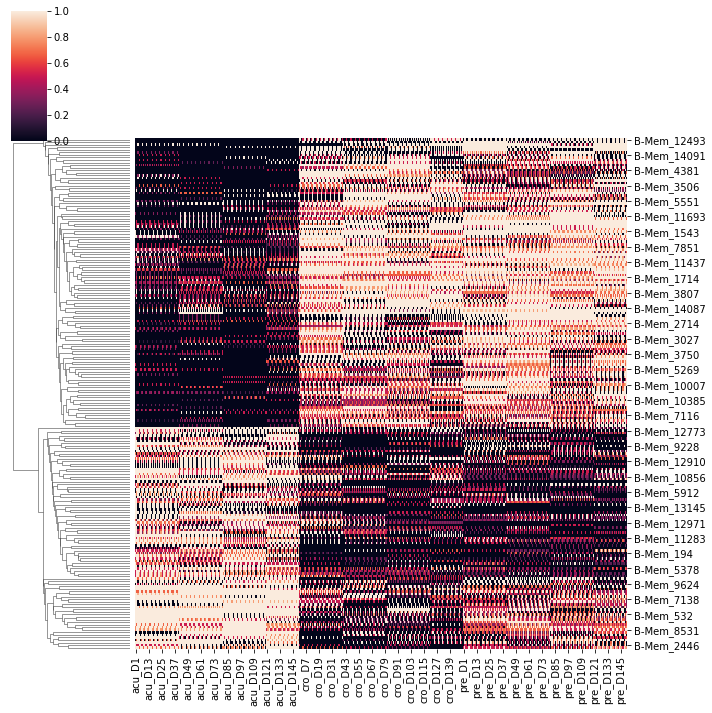

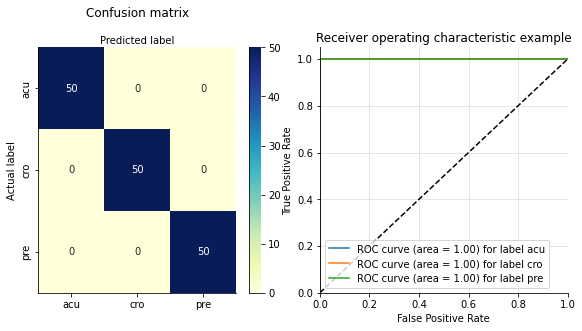

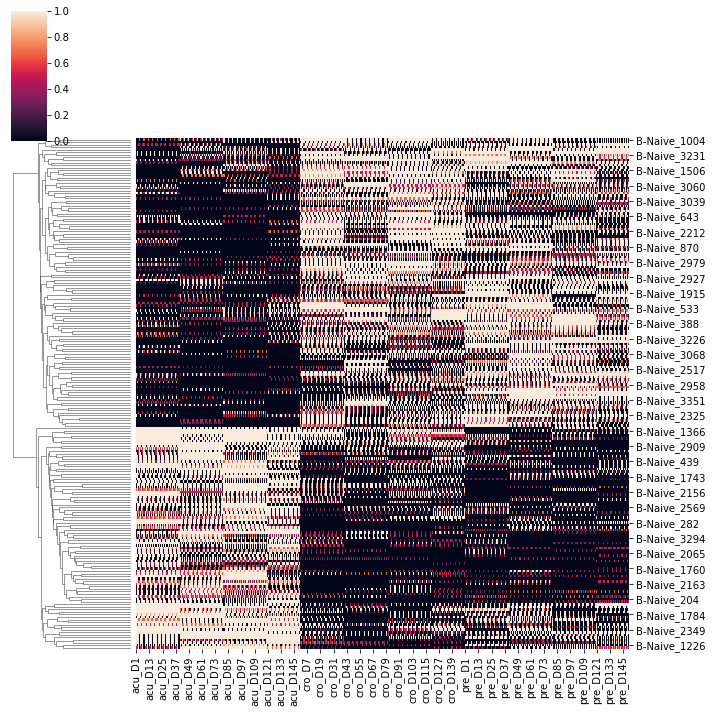

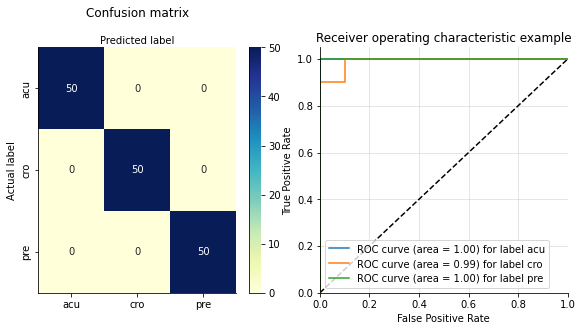

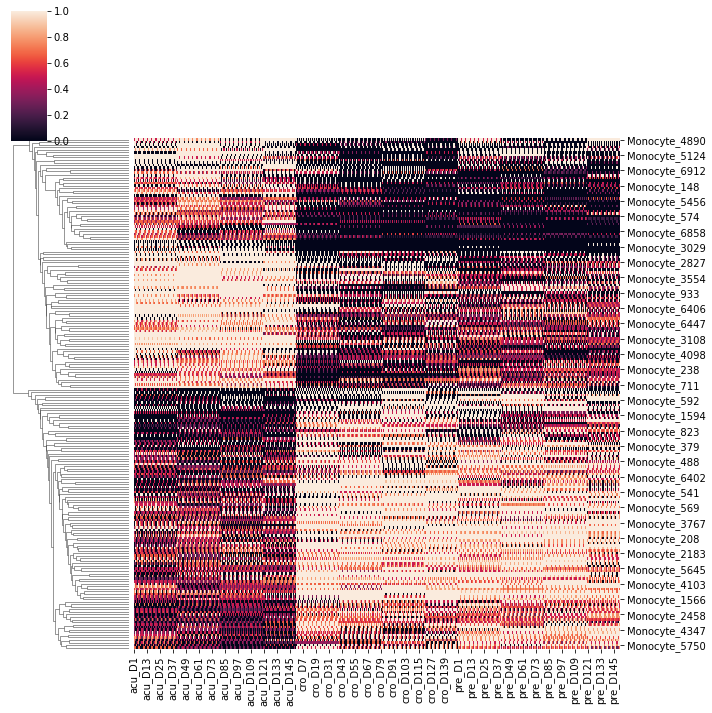

...

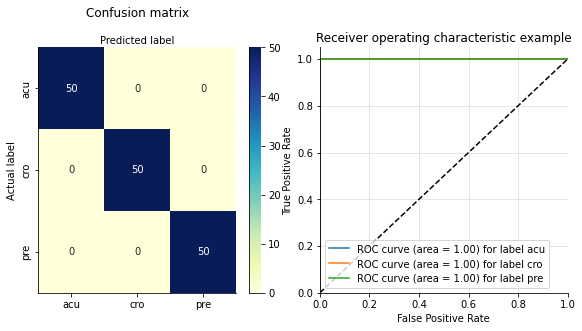

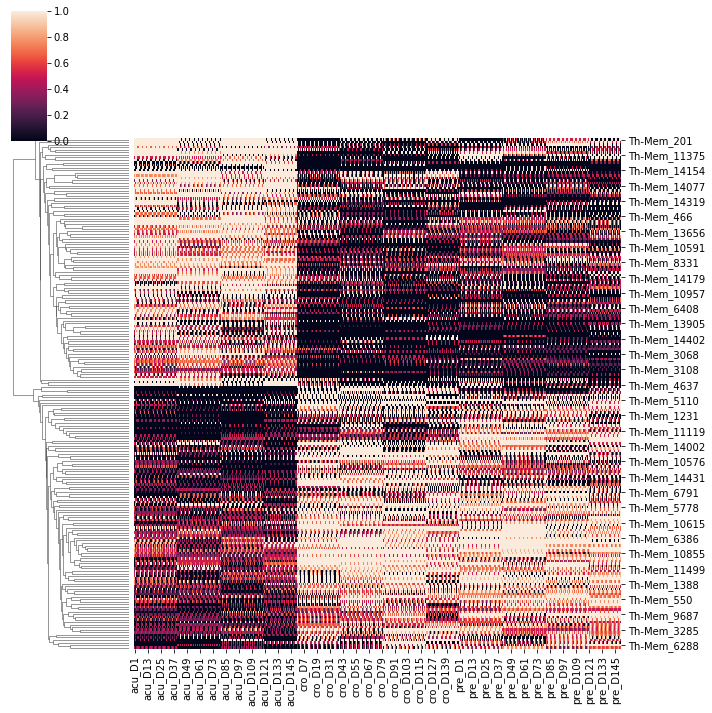

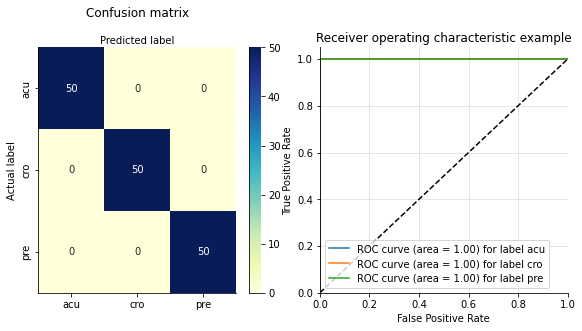

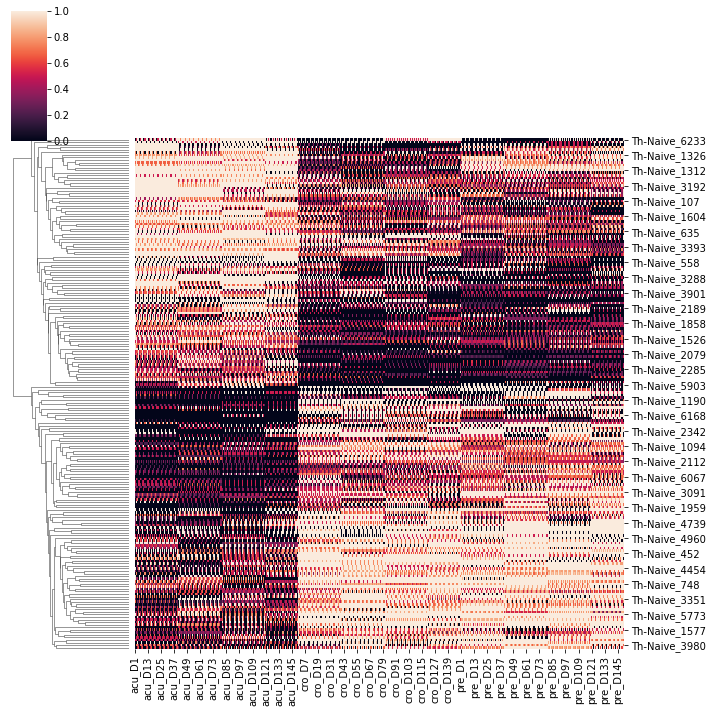

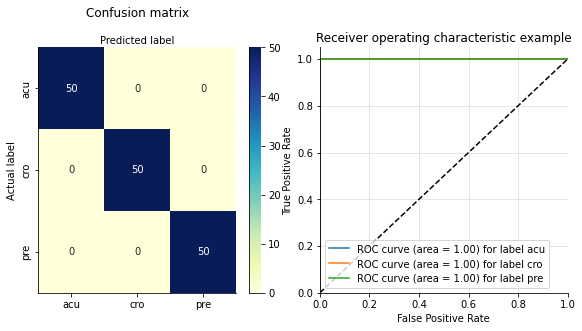

In [25]:
for cell_type in cell_types:
    train_data = pd.read_csv(f"{outdir}/{cell_type}/DML_train_data_All.csv", index_col=0)
    test_data = pd.read_csv(f"{outdir}/{cell_type}/DML_test_data_All.csv", index_col=0)
    train_data.fillna(0, inplace=True)
    test_data.fillna(0, inplace=True)
    multi_logic_regression(train_data, test_data, f'{outdir}/{cell_type}', 'DML_All')

In [26]:
for cell_type in cell_types:
    weight_df = pd.read_csv(f"{cell_type}/DML_All.importance.tsv", sep="\t", names=['id', 'weight'])
    dmls_df = pd.read_csv(f"{cell_type}/DMLs.bed.gz", sep="\t", names=['chrom', 'start','end','id'])
    
    merge_df = dmls_df.merge(weight_df, left_on='id', right_on='id')
    weighted_dmrs = merge_df[merge_df['weight']!=0]
    
    merge_df['start'] = merge_df['start'] - 6
    merge_df['end'] = merge_df['end'] + 6
    weighted_dmrs = weighted_dmrs[['chrom', 'start', 'end', 'id', 'weight']]
    
    weighted_dmrs.to_csv(f'{cell_type}/HIV_{cell_type}_DMRs_weight.bed', index=False, header=False, sep="\t")

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/gale/netapp/DoD/wenliang/bin/miniconda3_4.9.2/envs/echo/lib/python3.8/site-packages/sklearn/linear_model/_s

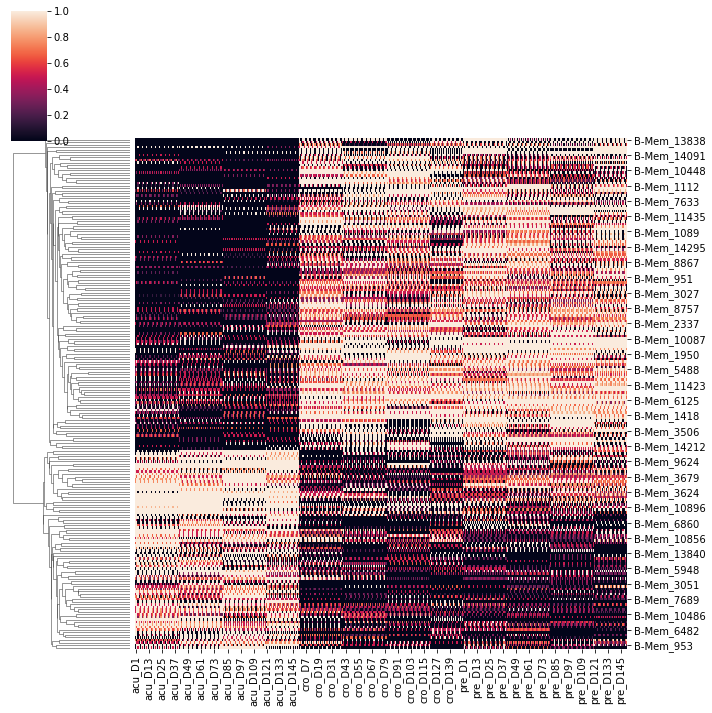

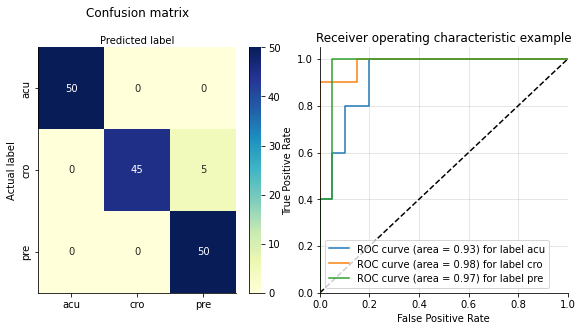

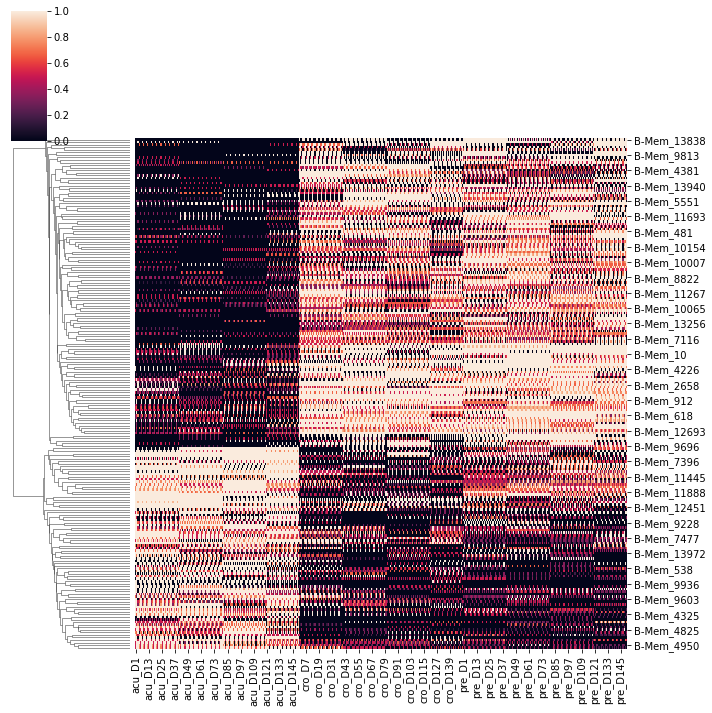

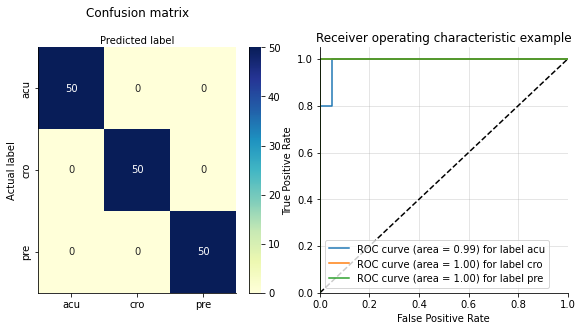

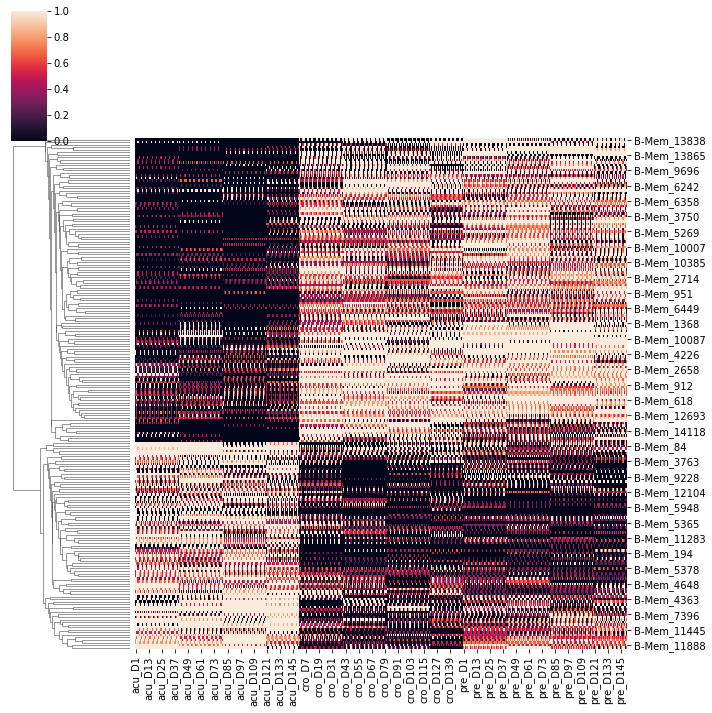

...

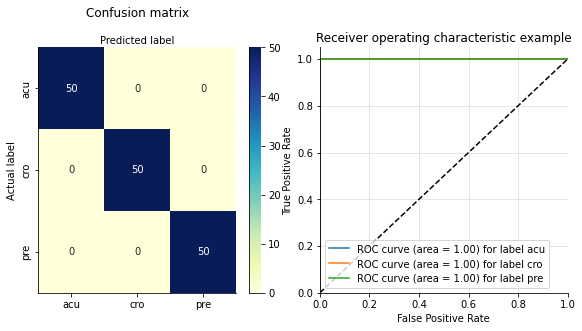

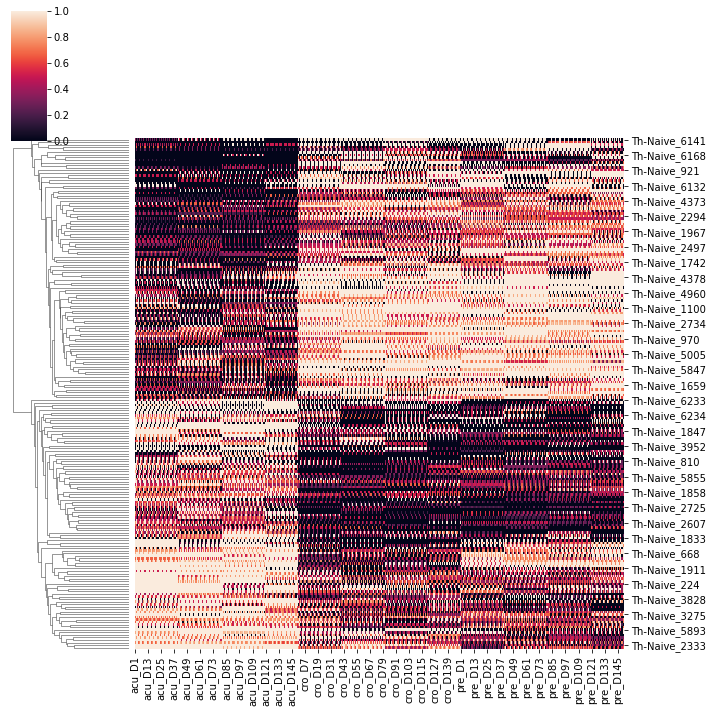

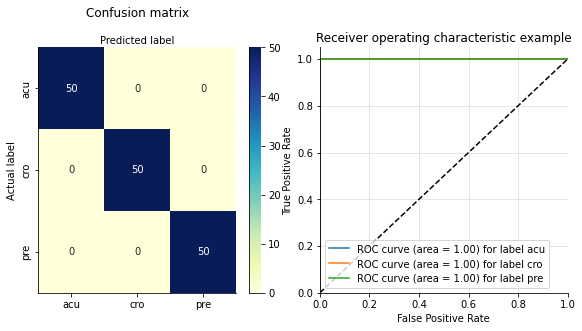

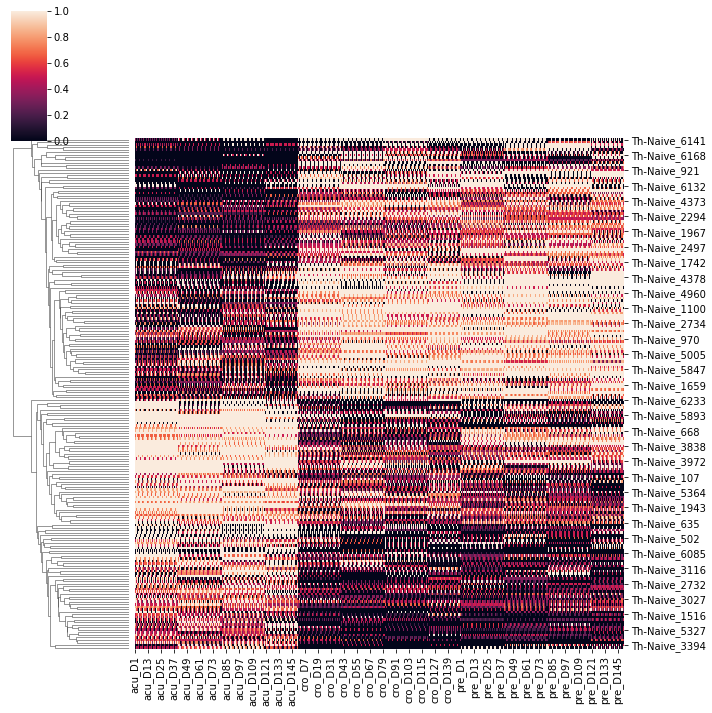

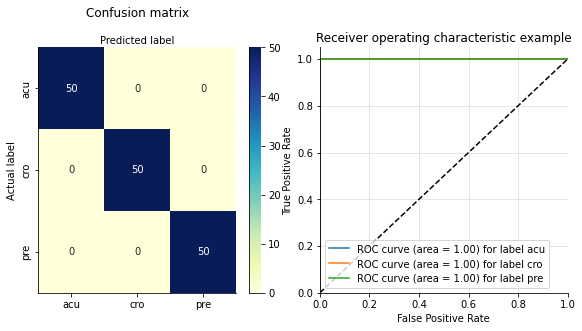

In [27]:
for cell_type in cell_types:
    roc_auc_dict = defaultdict(dict)
    for i in range(1, 10):
        ratio = 100 * i / 10
        weight_df = pd.read_csv(f"{cell_type}/DML_All.importance.tsv", sep="\t", names=['id', 'weight'])
        weight_df['abs_coef'] = [abs(x) for x in weight_df['weight']]
        n = int(ratio * weight_df.shape[0] / 100)
        sort_features = weight_df.nlargest(n, 'abs_coef').sort_values(by='weight')['id'].to_list()
        
        train_data = pd.read_csv(f"{outdir}/{cell_type}/DML_train_data_All.csv", index_col=0)
        test_data = pd.read_csv(f"{outdir}/{cell_type}/DML_test_data_All.csv", index_col=0)
        
        sort_features.append('exposure')
        train_data = train_data[sort_features]
        test_data = test_data[sort_features]
        train_data.fillna(0, inplace=True)
        test_data.fillna(0, inplace=True)
        labels = sorted(list(train_data['exposure'].unique()))
        roc_auc, precision, recall = multi_logic_regression(train_data, test_data, f'{outdir}/{cell_type}', f'DML_Percent{ratio}')
        
        for j, label in enumerate(labels):
            roc_auc_dict[i][f'{label}_auc'] = roc_auc[j]
            roc_auc_dict[i][f'{label}_precision'] = precision[j]
            roc_auc_dict[i][f'{label}_recall'] = recall[j]
    roc_auc_df = pd.DataFrame.from_dict(roc_auc_dict, orient='index')
    roc_auc_df.index.name = 'Percentage'
    roc_auc_df.to_csv(f'{outdir}/{cell_type}/prediction_report.tsv', sep="\t")

In [28]:
min_percentage = 10
for percentage, row in roc_auc_df.iterrows():
    auc_keys = ['acu_auc', 'cro_auc', 'pre_auc']
    if np.min(row[auc_keys]) > 0.95 and min_percentage > percentage:
        min_percentage = percentage
        for cell_type in cell_types:
            weight_df = pd.read_csv(f"{cell_type}/DML_Percent{percentage}0.0.importance.tsv", sep="\t", names=['id', 'weight'])
            dmls_df = pd.read_csv(f"{cell_type}/DMLs.bed.gz", sep="\t", names=['chrom', 'start','end','id'])

            merge_df = dmls_df.merge(weight_df, left_on='id', right_on='id')
            weighted_dmrs = merge_df[merge_df['weight']!=0]

            merge_df['start'] = merge_df['start'] - 6
            merge_df['end'] = merge_df['end'] + 6
            weighted_dmrs = weighted_dmrs[['chrom', 'start', 'end', 'id', 'weight']]

            weighted_dmrs.to_csv(f'{cell_type}/HIV_{cell_type}_minimal_DMRs_weight.bed', index=False, header=False, sep="\t")

In [29]:
for cell_type in cell_types:
    if not os.path.exists(f'{cell_type}/HIV_{cell_type}_minimal_DMRs_weight.bed'):
        cmd = f'ln -s {cell_type}/HIV_{cell_type}_DMRs_weight.bed {cell_type}/HIV_{cell_type}_DMRs_weight.bed'